

# **Assignment 1: Part A**

Experiment on univariate linear regression. We will pick only 2 features from the dataset and will train an univariate linear regression for each of them.


In this assignment, we will tackle a regression problem. We will be working on a dataset consolidated from census data in the USA. The goal is to accurately predict cancer mortality based on information related to US counties.The dataset contains 33 different features (demography, medical information). 

The metric used to assess model performance is MSE (mean squared error).

### 1. Load and Explore Dataset

In [43]:
#import packages
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

#Train file URL Link
csv_url_train = "https://raw.githubusercontent.com/shalimarchalhoub/Regression-Assignment/main/cancer_us_county-training.csv"

#Test file URL Link
csv_url_test = "https://raw.githubusercontent.com/shalimarchalhoub/Regression-Assignment/main/cancer_us_county-testing.csv"

#Load Train data into DataFrame df_train
df_train = pd.read_csv(csv_url_train)

#Load Test Data into Datframe df_test
df_test = pd.read_csv(csv_url_test)

#Display the First 5 rows of the train dataset
df_train.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,Id
0,88.000000,40,261.0,561.400000,29090,13352,26.8,2771.120431,"[22640, 34218.1]",39.8,...,32.0,47.5,32.9,99.693045,0.044920,0.000000,0.000000,55.499459,6.838710,0
1,73.000000,35,167.3,345.600000,29782,21903,38.8,0.000000,"[22640, 34218.1]",32.3,...,18.8,45.3,34.1,94.791383,1.649850,0.063631,2.854286,52.818296,4.799131,1
2,292.000000,124,191.0,468.400000,41955,48985,15.5,0.000000,"(40362.7, 42724.4]",42.2,...,44.9,34.5,16.0,95.102348,1.741749,0.376429,0.445611,50.560800,3.996826,2
3,1962.667684,7,165.4,453.549422,55378,3007,11.1,0.000000,"(54545.6, 61494.5]",41.6,...,49.6,30.1,15.2,85.833870,0.933677,0.160979,7.244044,52.565181,3.291536,3
4,43.000000,20,160.6,349.700000,26309,8551,35.3,0.000000,"[22640, 34218.1]",43.9,...,30.4,45.1,24.5,24.535525,73.223736,0.394100,1.396239,33.641208,3.166561,4


Exploring the Dataset

In [44]:
#Get the desciptive analysis of the Train Dataset
df_train.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,Id
count,2438.000000,2438.000000,2438.000000,2438.000000,2438.000000,2.438000e+03,2438.000000,2438.000000,2438.000000,2438.000000,...,2438.000000,2438.000000,2438.000000,2438.000000,2438.000000,2438.000000,2438.000000,2438.000000,2438.000000,2438.000000
mean,587.171930,180.592699,178.848482,448.308247,47028.427810,9.851579e+04,16.854348,166.019192,45.313782,39.640853,...,41.242453,36.275718,19.234824,83.776008,9.043586,1.230949,1.947961,51.216669,5.627447,1523.789171
std,1236.447895,438.473144,27.538452,53.247868,11919.386622,2.745272e+05,6.388398,563.813830,45.053173,5.217646,...,9.366433,7.823347,6.094083,16.275962,14.361902,2.558111,3.541698,6.501254,1.966257,874.905673
min,6.000000,3.000000,66.300000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,...,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000,0.000000
25%,76.000000,28.000000,161.400000,420.300000,38872.750000,1.154575e+04,12.100000,0.000000,37.800000,36.400000,...,34.600000,30.925000,15.000000,77.341176,0.634412,0.247022,0.288937,47.826087,4.516355,775.250000
50%,172.500000,62.000000,178.100000,453.549422,45186.500000,2.694250e+04,15.900000,0.000000,41.000000,39.600000,...,41.300000,36.400000,18.800000,90.121405,2.302054,0.550713,0.798971,51.662077,5.366485,1512.500000
75%,521.500000,151.000000,195.300000,481.975000,52492.500000,6.952450e+04,20.400000,92.562203,44.075000,42.500000,...,47.600000,41.500000,23.100000,95.464864,10.452697,1.207158,2.106155,55.331622,6.458322,2279.750000
max,24965.000000,9445.000000,293.900000,1014.200000,125635.000000,5.238216e+06,47.400000,9762.308998,624.000000,64.700000,...,70.700000,65.100000,46.600000,100.000000,84.866024,42.619425,41.930251,78.075397,18.556701,3046.000000


In [45]:
#Get the info of the Train Dataset in order to check which columns have missing values
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438 entries, 0 to 2437
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              2438 non-null   float64
 1   avgDeathsPerYear         2438 non-null   int64  
 2   TARGET_deathRate         2438 non-null   float64
 3   incidenceRate            2438 non-null   float64
 4   medIncome                2438 non-null   int64  
 5   popEst2015               2438 non-null   int64  
 6   povertyPercent           2438 non-null   float64
 7   studyPerCap              2438 non-null   float64
 8   binnedInc                2438 non-null   object 
 9   MedianAge                2438 non-null   float64
 10  MedianAgeMale            2438 non-null   float64
 11  MedianAgeFemale          2438 non-null   float64
 12  Geography                2438 non-null   object 
 13  AvgHouseholdSize         2438 non-null   float64
 14  PercentMarried          

In [46]:
#Get the info of the Test Dataset
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 609 entries, 0 to 608
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              609 non-null    float64
 1   avgDeathsPerYear         609 non-null    int64  
 2   TARGET_deathRate         609 non-null    float64
 3   incidenceRate            609 non-null    float64
 4   medIncome                609 non-null    int64  
 5   popEst2015               609 non-null    int64  
 6   povertyPercent           609 non-null    float64
 7   studyPerCap              609 non-null    float64
 8   binnedInc                609 non-null    object 
 9   MedianAge                609 non-null    float64
 10  MedianAgeMale            609 non-null    float64
 11  MedianAgeFemale          609 non-null    float64
 12  Geography                609 non-null    object 
 13  AvgHouseholdSize         609 non-null    float64
 14  PercentMarried           6

## Visualizations

In [47]:
#Checking Corrolation between my data
corr_matrix = df_train.corr()
corr_df = corr_matrix.reset_index().melt(id_vars='index')

heatmap = alt.Chart(corr_df).mark_rect().encode(
    x=alt.X('variable:N', title=''),
    y=alt.Y('index:N', title=''),
    color=alt.Color('value:Q', scale=alt.Scale(scheme='redyellowblue'))
)
heatmap

alt.Chart(...)

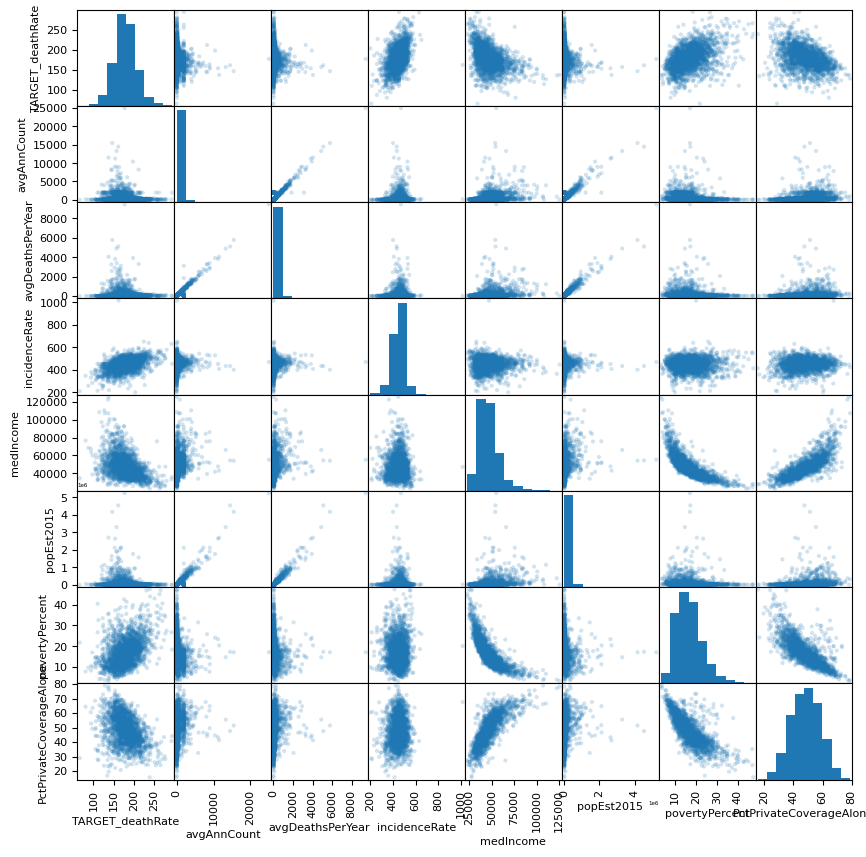

In [48]:
def scatter_matrix(data, figsize=(10,10)):
    with plt.rc_context({'axes.labelsize': 8, 'xtick.labelsize': 4, 'ytick.labelsize': 4}):
        pd.plotting.scatter_matrix(data, alpha=0.2, diagonal='hist', figsize=figsize)
        plt.show()
data = df_train[['TARGET_deathRate', 'avgAnnCount','avgDeathsPerYear', 'incidenceRate','medIncome', 'popEst2015', 'povertyPercent', 'PctPrivateCoverageAlone']]
scatter_matrix(data)

## 2. The First Chosen Variable is Incidence Rate

In [49]:
#Visualize Relationship between target variable and Incidence Rate
scatter_chart = alt.Chart(df_train).mark_circle(size=15, color='red').encode(
    x='incidenceRate',
    y='TARGET_deathRate'
)
scatter_chart

alt.Chart(...)



### 3. Data Preparation

In [50]:
#Clean Dataset From Outliers
df_train_copy = df_train[df_train['incidenceRate'].between(200, 600)]
df_test_copy = df_test[df_test['incidenceRate'].between(200, 600)]

#Prep train dataset
x_train = df_train_copy['incidenceRate'].values #predictor variable
y_train = df_train_copy['TARGET_deathRate'].values #target variable

#Prep test dataset
x_test = df_test_copy['incidenceRate'].values #predictor variable 
y_test = df_test_copy['TARGET_deathRate'].values #target variable 

### 4. Linear Regression Model

Training the Model

In [51]:
reg1 = LinearRegression()
reg1.fit(x_train.reshape(-1, 1),y_train)

#Make Prediction on the Train set to train the data
y_pred = reg1.predict(x_train.reshape(-1, 1))

#check Mean Squarred Error on the training set
mse_train = mean_squared_error(y_train, y_pred)
print("MSE: " , mse_train)

#Check the Sum of Errrors
print("Sum of errors is:", (y_pred - y_train).sum())

MSE:  602.5507190968624
Sum of errors is: 3.2940761229838245e-11


Testing the Model

In [52]:
#Do the prediction on the test set
y_pred_final = reg1.predict(x_test.reshape(-1, 1))

#check Mean Squarred Error on the test set
mse_test = mean_squared_error(y_test, y_pred_final)
print("MSE: " , mse_test)

#Check the Sum of Errrors
print("Sum of errors is:", (y_pred_final - y_test).sum())


MSE:  616.2699362503008
Sum of errors is: 490.4870969784586


### 6. Plotting Model's Performance


In [53]:
line_chart = alt.Chart(pd.DataFrame({'x': x_test, 'y': y_pred_final})).mark_line().encode(
    x='x',
    y='y'
  )
scatter_chart + line_chart

alt.LayerChart(...)

## The second chosen variable is PctPublicCoverageAlone

In [54]:
#Running correlation model to check which values are corrolated the most with the target

correlations = df_train.corrwith(df_train['TARGET_deathRate'])

# Sort the correlation coefficients in descending order and print the top values
sorted_correlations = correlations.abs().sort_values(ascending=False)
print(sorted_correlations)

TARGET_deathRate           1.000000
PctBachDeg25_Over          0.497175
PctPublicCoverageAlone     0.465428
povertyPercent             0.439484
incidenceRate              0.437904
medIncome                  0.437020
PctEmployed16_Over         0.418447
PctPublicCoverage          0.416928
PctUnemployed16_Over       0.407984
PctHS25_Over               0.402765
PctPrivateCoverage         0.397915
PctPrivateCoverageAlone    0.371514
PctBachDeg18_24            0.295886
PctMarriedHouseholds       0.292463
PctEmpPrivCoverage         0.275397
PercentMarried             0.267103
PctHS18_24                 0.262336
PctBlack                   0.249802
PctOtherRace               0.185831
PctAsian                   0.180415
PctSomeCol18_24            0.178846
PctWhite                   0.172773
avgAnnCount                0.149194
popEst2015                 0.124771
avgDeathsPerYear           0.089487
PctNoHS18_24               0.082713
BirthRate                  0.077583
AvgHouseholdSize           0

In [55]:
#Visualize Relationship between target variable and PctPublicCoverageAlone

scatter_chart2 = alt.Chart(df_train).mark_circle(size=15, color='red').encode(
    x='PctPublicCoverageAlone',
    y='TARGET_deathRate'
)
scatter_chart2

alt.Chart(...)

In [56]:
#Clean Dataset From Outliers
df_train_1 = df_train[df_train['PctPublicCoverageAlone'].between(5, 27)]
df_test_1 = df_test[df_test['PctPublicCoverageAlone'].between(5, 27)]
df_train_2 = df_train_1[df_train_1['TARGET_deathRate'].between(100, 250)]
df_test_2 = df_test_1[df_test_1['TARGET_deathRate'].between(100, 250)]
#Prep train dataset
x_train2 = df_train_2['PctPublicCoverageAlone'].values.reshape(-1,1) #predictor variable
y_train2 = df_train_2['TARGET_deathRate'].values #target variable

#Prep test dataset
x_test2 = df_test_2['PctPublicCoverageAlone'].values #predictor variable 
y_test2 = df_test_2['TARGET_deathRate'].values #target variable 

In [57]:
#checking missing values
df_train['PctPublicCoverageAlone'].isna().sum()

0

In [58]:
#Missing values
df_test['PctPublicCoverageAlone'].isna().sum()

0

## Linear Regression Model 2

In [59]:
reg2 = LinearRegression()
reg2.fit(x_train2.reshape(-1, 1),y_train2)

#Make Prediction on the Train set to train the data
y_pred2 = reg2.predict(x_train2)

#check Mean Squarred Error on the training set
mse_train2 = mean_squared_error(y_train2, y_pred2)
print("MSE: " , mse_train2)

#Check the Sum of Errrors
print("Sum of errors is:", (y_pred2 - y_train2).sum())

MSE:  480.7222729780048
Sum of errors is: -5.95719029661268e-11


Testing the model's performance

In [60]:
#Do the prediction on the test set
y_pred_final2 = reg2.predict(x_test2.reshape(-1, 1))

#check Mean Squarred Error on the test set
mse_test2 = mean_squared_error(y_test2, y_pred_final2)
print("MSE: " , mse_test2)

#Check the Sum of Errrors
print("Sum of errors is:", (y_pred_final2 - y_test2).sum())

MSE:  507.2823423425601
Sum of errors is: 728.775371651222


## Plotting model's performance

In [61]:
line_chart2 = alt.Chart(pd.DataFrame({'x': x_test2, 'y': y_pred_final2})).mark_line().encode(
    x='x',
    y='y'
  )
scatter_chart2 + line_chart2

alt.LayerChart(...)